In [119]:
import os
import sys

sys.path.append(os.path.abspath(os.path.join('..'))) # imports top level

In [120]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import display
import scipy
from collections import defaultdict

import random

In [121]:
from joblib import load

In [122]:
plt.rc('font', **{"size": 12})

In [123]:
pop = load("trained_population_121_data_for_nsgaii_300ps_med.joblib")

In [124]:
pop

[{'id': 'e04148937ab040d599ece186d22f930b',
  'fuels_gnome': array([48.58, 17.12, 3.36, 8.89, 0.0, 26.51, 51.57, 57.94, 29.39, 47.53,
         36.57, 36.39, 0.0, 47.07, 26.19, 55.19, 41.99, 6.52, 16.64, 3.79],
        dtype=object),
  'core_burnup': 28.1,
  'p_margin': 0.8709056737417187,
  'k_fa_max': 0.9458379765650153,
  'k_fa_min': 0.7499921536310765,
  'k_quarter': 0.9679814080404416,
  'k_sym': 0.8725383684107964,
  'k_left_right': 0.9906995548649592,
  'fitness_score': 0.9378570949390252,
  'nb': 0},
 {'id': '2ad6018fed404ca4a870543c1101f4a5',
  'fuels_gnome': array([48.58, 17.12, 3.36, 8.89, 0.0, 26.51, 51.57, 57.94, 29.39, 47.53,
         36.57, 36.39, 0.0, 47.07, 26.19, 55.19, 41.99, 6.52, 16.64, 3.79],
        dtype=object),
  'core_burnup': 28.1,
  'p_margin': 0.8709056737417187,
  'k_fa_max': 0.9458379765650153,
  'k_fa_min': 0.7499921536310765,
  'k_quarter': 0.9679814080404416,
  'k_sym': 0.8725383684107964,
  'k_left_right': 0.9906995548649592,
  'fitness_score': 0.9378

In [125]:
weights = {
    # "p_margin": 0.10, # use fuel burnup coef instead of this
    # "k_fa_max": 0.10,
    "k_quarter": 1, # modify in order to estimate this symmetry more accurate 
    "k_sym": 1,
    "k_sided": 1
}

scores = []
k_sym = []
k_quarter = []
p_margin = []
k_fa_max = []
k_sided = []

for i in pop:
    scores.append(
        i["fitness_score"] 
    )
    k_sym.append(
        i["k_sym"] * weights["k_sym"]
    )
    k_quarter.append(
        i["k_quarter"] * weights["k_quarter"]
    )
    # p_margin.append(
    #     i["p_margin"] * weights["p_margin"]
    # )
    
    # k_fa_max.append(
    #     i["k_fa_max"] * weights["k_fa_max"]
    # )
    
    k_sided.append(
        i["k_left_right"] * weights["k_sided"]
    )

In [126]:
k_quarter=np.array(k_quarter)
k_sym=np.array(k_sym)
scores=np.array(scores)
p_margin=np.array(p_margin)
k_fa_max=np.array(k_fa_max)

<Axes: >

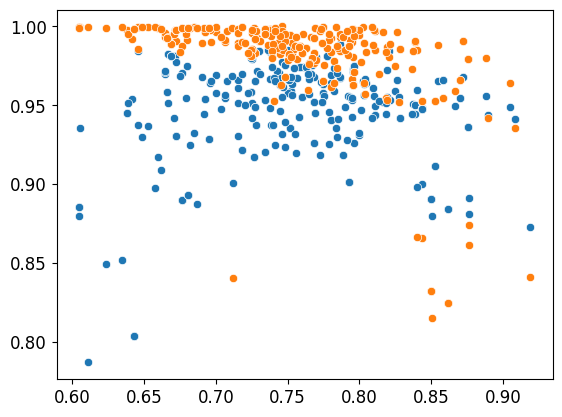

In [127]:
sns.scatterplot(x=k_sym, y=k_quarter)
sns.scatterplot(x=k_sym, y=k_sided)

# NonDominated sort

In [128]:
objective_functions = [
    # "p_margin",
    # "k_fa_max",
    
    "k_sym",
    "k_quarter",
    # "k_left_right"
]

def check_dominance(p, q):
    p_counter, q_counter = 0, 0
    
    for of1 in objective_functions:
        if p[of1] >= q[of1]:
            q_counter += 1
        else:
            p_counter += 1
    if p_counter == 0:
        return True
    elif q_counter == 0:
        return False
    return "nondominance"

In [129]:
S = {}
F1 = []
ed_pop = pop.copy()
for nump in range(len(ed_pop)):
    S[
        ed_pop[nump]["id"]
    ] = defaultdict(list)
    Sp = []
    npp = 0
    ed_pop[nump]["nq"] = 0
    for numq in range(len(ed_pop)):
        
        if ed_pop[nump]["id"] == ed_pop[numq]["id"]:
            continue
        
        dominance = check_dominance(
            ed_pop[nump],
            ed_pop[numq],
        )
        if dominance == True:
            Sp.append(
                ed_pop[numq]
            )
        elif dominance == False:
            npp += 1
            ed_pop[nump]["nq"] += 1
    S[
        ed_pop[nump]["id"]
    ]["np"] = npp
    
    if npp == 0:
        F1.append(
            ed_pop[nump].copy()
        )
    
    S[
        ed_pop[nump]["id"]
    ]["Sp"] = Sp
S["F1"] = F1

In [130]:
F1

[{'id': 'e04148937ab040d599ece186d22f930b',
  'fuels_gnome': array([48.58, 17.12, 3.36, 8.89, 0.0, 26.51, 51.57, 57.94, 29.39, 47.53,
         36.57, 36.39, 0.0, 47.07, 26.19, 55.19, 41.99, 6.52, 16.64, 3.79],
        dtype=object),
  'core_burnup': 28.1,
  'p_margin': 0.8709056737417187,
  'k_fa_max': 0.9458379765650153,
  'k_fa_min': 0.7499921536310765,
  'k_quarter': 0.9679814080404416,
  'k_sym': 0.8725383684107964,
  'k_left_right': 0.9906995548649592,
  'fitness_score': 0.9378570949390252,
  'nb': 0,
  'nq': 0},
 {'id': '2ad6018fed404ca4a870543c1101f4a5',
  'fuels_gnome': array([48.58, 17.12, 3.36, 8.89, 0.0, 26.51, 51.57, 57.94, 29.39, 47.53,
         36.57, 36.39, 0.0, 47.07, 26.19, 55.19, 41.99, 6.52, 16.64, 3.79],
        dtype=object),
  'core_burnup': 28.1,
  'p_margin': 0.8709056737417187,
  'k_fa_max': 0.9458379765650153,
  'k_fa_min': 0.7499921536310765,
  'k_quarter': 0.9679814080404416,
  'k_sym': 0.8725383684107964,
  'k_left_right': 0.9906995548649592,
  'fitness_sco

In [131]:
S

{'e04148937ab040d599ece186d22f930b': defaultdict(list,
             {'np': 0,
              'Sp': [{'id': '2ad6018fed404ca4a870543c1101f4a5',
                'fuels_gnome': array([48.58, 17.12, 3.36, 8.89, 0.0, 26.51, 51.57, 57.94, 29.39, 47.53,
                       36.57, 36.39, 0.0, 47.07, 26.19, 55.19, 41.99, 6.52, 16.64, 3.79],
                      dtype=object),
                'core_burnup': 28.1,
                'p_margin': 0.8709056737417187,
                'k_fa_max': 0.9458379765650153,
                'k_fa_min': 0.7499921536310765,
                'k_quarter': 0.9679814080404416,
                'k_sym': 0.8725383684107964,
                'k_left_right': 0.9906995548649592,
                'fitness_score': 0.9378570949390252,
                'nb': 0,
                'nq': 0},
               {'id': '15c0a53fe14747d188d73f58d5b36c8d',
                'fuels_gnome': array([47.53, 17.12, 8.89, 3.79, 0.0, 26.51, 51.57, 57.94, 29.39, 48.58,
                       41.99, 36.3

In [132]:
# front counter
i = 1
F = {
    i: F1.copy()
}

run = True
while run:
    Q = []
    for p in F[i]:
        for numq in range(len(S[p["id"]]["Sp"])):
            S[p["id"]]["Sp"][numq]["nq"] -= 1
            if S[p["id"]]["Sp"][numq]["nq"] == 0:
                Q.append(
                    S[p["id"]]["Sp"][numq].copy()
                )
    if len(Q) == 0:
        break
    i += 1
    F[i] = Q.copy()
                

In [133]:
F.keys()

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24])

In [134]:
# display fronts
k_s, k_q = [], []
for k, v in F.items():
    
    k_s.append([i["k_sym"] for i in v])
    k_q.append([i["k_quarter"] for i in v])



Text(0, 0.5, 'Симметрия по четвертям')

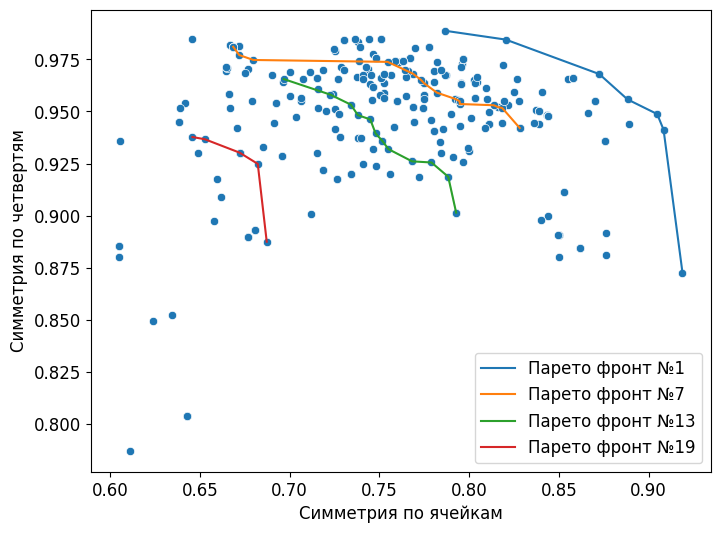

In [135]:
fig, ax = plt.subplots(figsize=(8,6))
sns.scatterplot(x=k_sym, y=k_quarter)

for i in range(0, len(F), 6):
    
    sns.lineplot(
        x=k_s[i], y=k_q[i],
        label=f"Парето фронт №{i+1}"
    )

plt.xlabel("Симметрия по ячейкам")
plt.ylabel("Симметрия по четвертям")
# plt.xlim(0.80, 1)
# plt.ylim(0.7, 1)

# Crowding distance selection

## Sort each objective in ascending order

In [146]:
def get_objective(objective_key, front):
    return [
        i[objective_key]
        for i in front
    ]

In [147]:
np.array([5,4,1,2])[np.argsort([5,4,1,2])]

array([1, 2, 4, 5])

8
19
32
56
86
110
131
143
[[19, 17, 18, 16, 15, 23, 22, 20, 21, 8, 14, 9, 10, 11, 12, 13, 7, 6, 0, 1, 2, 3, 4, 5], [0, 1, 2, 3, 4, 5, 6, 7, 12, 13, 9, 10, 11, 14, 8, 20, 21, 22, 23, 15, 16, 18, 17, 19]]
initial [0.         0.02068791 0.00965862 0.02713715 0.01610785 0.
 0.         0.         0.         0.00214901 0.00538445 0.01436188
 0.01584027 0.00362739 0.         0.00538445 0.00540718 0.01000136
 0.         0.0118371  0.05353278 0.05385923 0.02230181 0.01483586] 
 sorted [0.         0.0118371  0.05353278 0.05385923 0.02230181 0.01483586
 0.01000136 0.00540718 0.00214901 0.01436188 0.01584027 0.00362739
 0.         0.00538445 0.00538445 0.01610785 0.02713715 0.02068791
 0.00965862 0.         0.         0.         0.         0.        ]
initial [0.         0.         0.         0.         0.         0.00297932
 0.00493374 0.00473667 0.00510776 0.01159728 0.00041571 0.00041571
 0.         0.00869435 0.00278226 0.00067483 0.00095791 0.00099777
 0.         0.00220483 0.00131693 0.00248

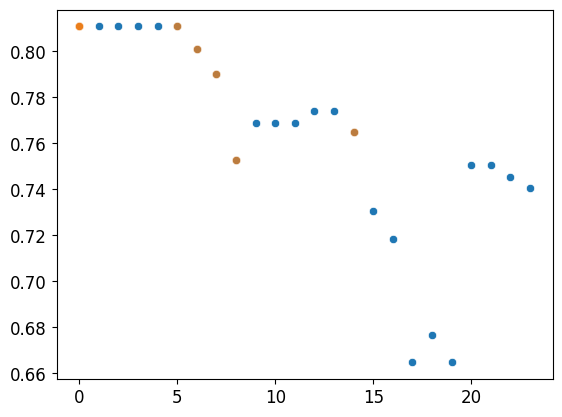

In [196]:
space_left = 150
filled = 0
front_to_cds = 0
cds_to_store = []
for nf, front in enumerate(F.values()):
    if filled+len(front) >= space_left:
        front_to_cds = nf
        
        select_from_front = space_left - filled
        # iterate over objectives
        sorted_objs = [
            sorted(get_objective(ok, front))
            for ok in objective_functions
        ]
        initial_objs = [
            get_objective(ok, front)
            for ok in objective_functions
        ]
        sns.scatterplot(initial_objs[0])
        
        initial_inds = []
        for o in range(len(sorted_objs)):
            initial_ind = []
            for ni, i in enumerate(sorted_objs[o]):
                for nj, j in enumerate(initial_objs[o]):
                    if i == j and not nj in initial_ind:
                        # print(i,j)
                        initial_ind.append(nj)
                        # break
            initial_inds.append(initial_ind)
        print(initial_inds)
        
        l_dis = np.full(
            (len(sorted_objs[0])),
            0.0
        )
        for n, obj in enumerate(sorted_objs):
            l_obj = np.full(
                (len(obj)),
                0.0
            )
            for ind_val in range(1, len(obj)-1):
                l_obj[ind_val] = obj[ind_val+1] - obj[ind_val-1]
            
            l_dis += l_obj[initial_inds[n]]
            print(
                "initial", l_obj[initial_inds[n]],
                "\n",
                "sorted", l_obj
            )
        less_cd = l_dis[np.argsort(l_dis)][:select_from_front]
        less_cd_inds = []
        for i in less_cd:
            less_cd_inds.append(list(l_dis).index(i))
        print(less_cd_inds)
        less_cd_inds.sort()
        less_cd_inds = np.asarray(less_cd_inds)
        less_io = np.asarray(initial_objs[0])[less_cd_inds]
        print(less_cd_inds)
        selected = np.array(front)[less_cd_inds]

        cds_inds_to_store = less_cd_inds
        
        sns.scatterplot(x=less_cd_inds, y=less_io, alpha=0.7)
        
        print(filled + len(selected) == space_left)
        print(f"front {nf}")
        break
    filled += len(front)
    print(filled)

In [197]:
F_with_cds = F[front_to_cds]
k_s_cds = [i["k_sym"] for i in F_with_cds]
k_q_cds = [i["k_quarter"] for i in F_with_cds]

(0.87, 1.0)

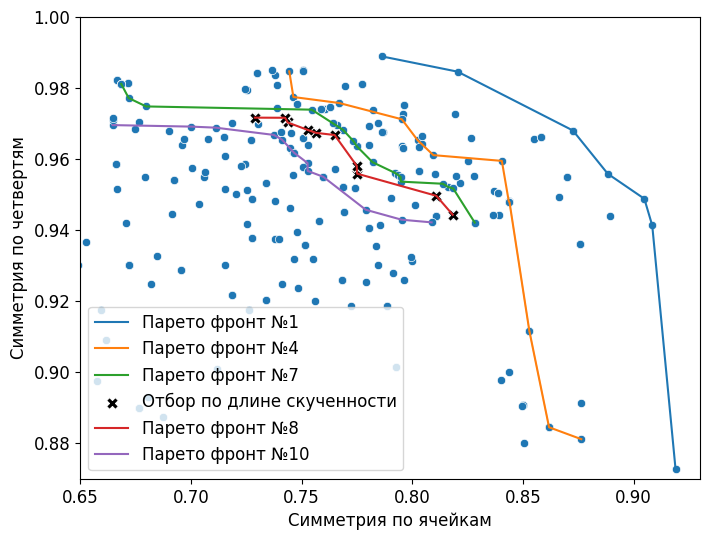

In [236]:
fig, ax = plt.subplots(figsize=(8,6))
sns.scatterplot(x=k_sym, y=k_quarter)

for i in range(0, len(F)-13, 3):

    sns.lineplot(
        x=k_s[i], y=k_q[i],
        label=f"Парето фронт №{i+1}"
    )
    
    if i+2 == front_to_cds:
        sns.scatterplot(
            x=k_s_cds,
            y=k_q_cds,
            color="black",
            marker="X",
            s=70,
            label="Отбор по длине скученности"
            
        )
        sns.lineplot(
            x=k_s[i+1], y=k_q[i+1],
            label=f"Парето фронт №{i+2}"
        )
    # if
    

plt.xlabel("Симметрия по ячейкам")
plt.ylabel("Симметрия по четвертям")
plt.xlim(0.65, 0.93)
plt.ylim(0.87, 1)